## SAE 2.0 - Communes Bretonnes
### Graphes

- Etudiants du Groupe 1B1-1:
  - GUNES Omer
  - PERON Romain
  - CAMPION Brayan

In [3]:
# importation des packages
import numpy as np
import pandas as pd
import seaborn as sns
import ast as ast
from geopy.distance import geodesic
# importation des modules
import scipy.stats as sps


import networkx as nx

import matplotlib.pyplot as plt
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

plt.rcParams["figure.figsize"] = (20,15)

C:\Users\omerf\AppData\Local\Temp\ipykernel_4796\754360761.py:3: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


## Le but de ce fichier est construire un graphe networkx à partir de données géolocalisée csv

### 1 Traitement des données csv :

In [4]:
# importation du fichier csv comme un panda dataframe
communes=pd.read_csv("./DonneesFourniesGraphes/voisinageCommunesBretonnes.csv", sep=';')

#on affiche les premières lignes du fichier
communes.head()

,insee,nom,nb_voisins,insee_voisins
0,22001,Allineuc,5,22203|22203|22384|22149|22009
1,22002,Andel,5,22093|22093|22044|22093|22093
2,22003,Aucaleuc,4,22259|22364|22388|22048
3,22004,Bégard,7,22041|22018|22310|22164|22135|22245|22254
4,22005,Belle-Isle-en-Terre,5,22135|22216|22129|22228|22359


In [5]:
communes.columns

Index(['insee', 'nom', 'nb_voisins', 'insee_voisins'], dtype='object')

In [6]:
# adaptation du format des données en liste des voisins (exemple)
print(communes['insee_voisins'][0])

print(communes.iloc[0,3])

[int(num) for num in communes['insee_voisins'][0].split('|')]

22203|22203|22384|22149|22009
22203|22203|22384|22149|22009


[22203, 22203, 22384, 22149, 22009]

In [7]:
#on enlève les voisins non bretons (22+29+35+56) et les boucles

def amezek(com):
    voisins = [int(num) for num in communes['insee_voisins'][com].split('|')]
    amezek = []
    for vois in voisins :
        if (22000 <= vois and vois<23000) or (29000 <= vois and vois<30000) or (35000 <= vois and vois<36000) or (56000 <= vois and vois<57000) : #on reste en bretagne
            if vois != communes['insee'][com] : #boucle
                amezek.append(vois)
    return amezek

#Cette methode permet de recuperer les voisins uniquement breton, c'est à dire qu'il va parcourir toute les communes presentes dans le CSV et il 
# va regarder la colonne insee_voisins, puis on va verifier que les numeros insees des communes se situe entre des bornes qui representes les departements
# entre 29 et 30, 22 et 23, 35 et 36, 56 et 57.


for x in range(len(communes['insee'])) : 
    amezek(x)

In [8]:
# Création d'un dictionaire représentant la liste des voisins, structure proche des graphes networkx

voisins_dict = {communes['insee'][x] : amezek(x) for x in range(len(communes['insee']))}
voisins_dict[29021]

[29064, 29198, 29091]

### 2 Création d'un graphe en format networkx

In [9]:
#creation directe via l'outil networkx
G = nx.from_dict_of_lists(voisins_dict)

print(len(G.nodes))
#for node in G.nodes:
#    print(node)
    

1197


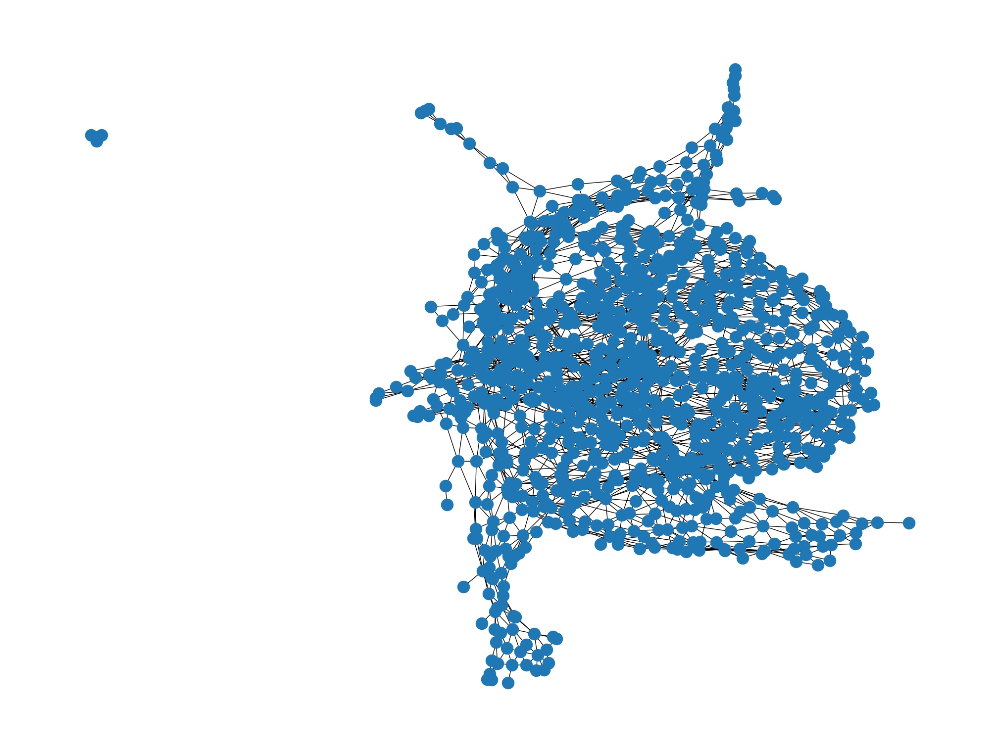

In [10]:
#pour l'instant les sommets ne sont pas placés géographiquement
nx.draw(G,pos=nx.spring_layout(G))


### 3 Exploitation des données géographiques

In [11]:
#lecture des informations geographique

geo=pd.read_csv("./DonneesFourniesGraphes/communes-geo.csv", sep=';')

geo.head()
geo_lite = geo.iloc[:,[0,1,17,19]]

geo_lite.columns

geo_lite['Geo Point'][0]

'47.965835834555435, -2.180339647082372'

In [12]:
# adaptation du format des données de géolocalisation (exemple)
ast.literal_eval(geo_lite['Geo Point'][0])

# création de la colone Latitude
geo_lite['Latitude']=geo_lite['Geo Point'].apply(lambda x : ast.literal_eval(x)[0])
# création de la colone Longitude
geo_lite['Longitude']=geo_lite['Geo Point'].apply(lambda x : ast.literal_eval(x)[1])

geo_lite.head()

,Geo Point,Geo Shape,Code Officiel Commune,Nom Officiel Commune,Latitude,Longitude
0,"47.965835834555435, -2.180339647082372","{""coordinates"": [[[-2.138393408174076, 47.9796...",56012,Beignon,47.965836,-2.180340
1,"48.13658848473797, -3.604143385699294","{""coordinates"": [[[-3.598896445577899, 48.0809...",56066,Gourin,48.136588,-3.604143
2,"47.66115932253269, -2.8979142904691706","{""coordinates"": [[[-2.914167012351387, 47.6298...",56167,Plougoumelen,47.661159,-2.897914
3,"47.8257861710007, -2.623531946315434","{""coordinates"": [[[-2.559861319644625, 47.7984...",56172,Plumelec,47.825786,-2.623532
4,"48.561815546029436, -2.3352456790830622","{""coordinates"": [[[-2.340377140698437, 48.5296...",22268,Ruca,48.561816,-2.335246


In [13]:
#ajout des données géographique



# proposition de dictionaire de position pour le tracé en networkx

def pos_insee(G,data):
    pos = {} #dictionnaire vide
    for com in G.nodes:
        y = float(data[data['Code Officiel Commune'] == com]['Latitude'].iloc[0])
        x = float(data[data['Code Officiel Commune'] == com]['Longitude'].iloc[0])
        #on peut adapter les coordonnées
        #x=(x- 48.13380133652042)*1000
        #y=(y+2.287539276431153)*1000
    
        pos[com]=[x,y]
    
    return pos

pos_insee = pos_insee(G,geo_lite)
#print(pos_insee)

print(len(G.nodes)==len(pos_insee))

print(pos_insee[56167])

True
[-2.8979142904691706, 47.66115932253269]


In [14]:
# proposition de dictionaire de label pour le tracé en networkx

def label_insee(G,data):
    label = {} #dictionnaire vide
    for com in G.nodes:
        lab = data[data['Code Officiel Commune'] == com]['Nom Officiel Commune'].iloc[0]
    
        label[com]=lab
    
    return label

label_insee = label_insee(G,geo_lite)
label_insee

{22001: 'Allineuc',
 22002: 'Andel',
 22003: 'Aucaleuc',
 22004: 'Bégard',
 22005: 'Belle-Isle-en-Terre',
 22006: 'Berhet',
 22055: 'Binic-Étables-sur-Mer',
 22008: 'Bobital',
 22009: 'Le Bodéo',
 22011: 'Boqueho',
 22012: 'La Bouillie',
 22013: 'Bourbriac',
 22014: 'Bourseul',
 22015: 'Bréhand',
 22018: 'Brélidy',
 22019: 'Bringolo',
 22020: 'Broons',
 22021: 'Brusvily',
 22023: 'Bulat-Pestivien',
 22024: 'Calanhel',
 22025: 'Callac',
 22026: 'Calorguen',
 22027: 'Le Cambout',
 22028: 'Camlez',
 22029: 'Canihuel',
 22030: 'Caouënnec-Lanvézéac',
 22031: 'Carnoët',
 22032: 'Caulnes',
 22033: 'Caurel',
 22034: 'Cavan',
 22035: 'Les Champs-Géraux',
 22036: 'La Chapelle-Blanche',
 22037: 'La Chapelle-Neuve',
 22206: 'Châtelaudren-Plouagat',
 22039: 'La Chèze',
 22040: 'Coadout',
 22041: 'Coatascorn',
 22042: 'Coatréven',
 22043: 'Coëtlogon',
 22044: 'Coëtmieux',
 22045: 'Cohiniac',
 22046: 'Le Mené',
 22047: 'Corlay',
 22048: 'Corseul',
 22049: 'Créhen',
 22050: 'Dinan',
 22084: 'Jugon-les

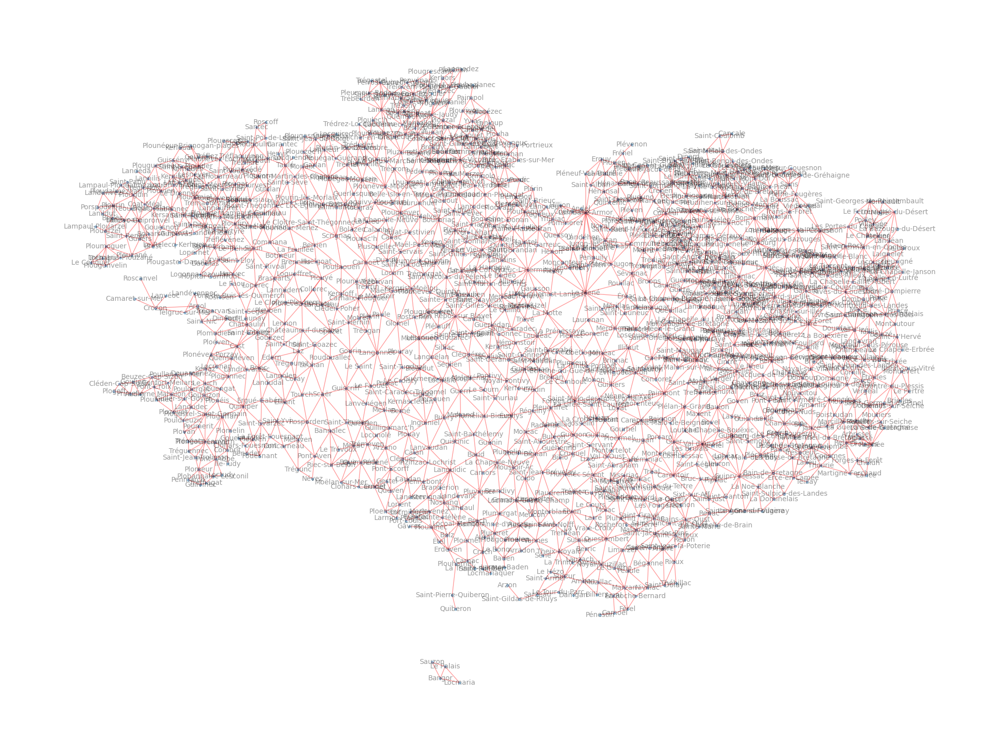

In [15]:
nx.draw(G,pos=pos_insee,node_size=10, alpha=0.4, edge_color="r", font_size=10, labels=label_insee)

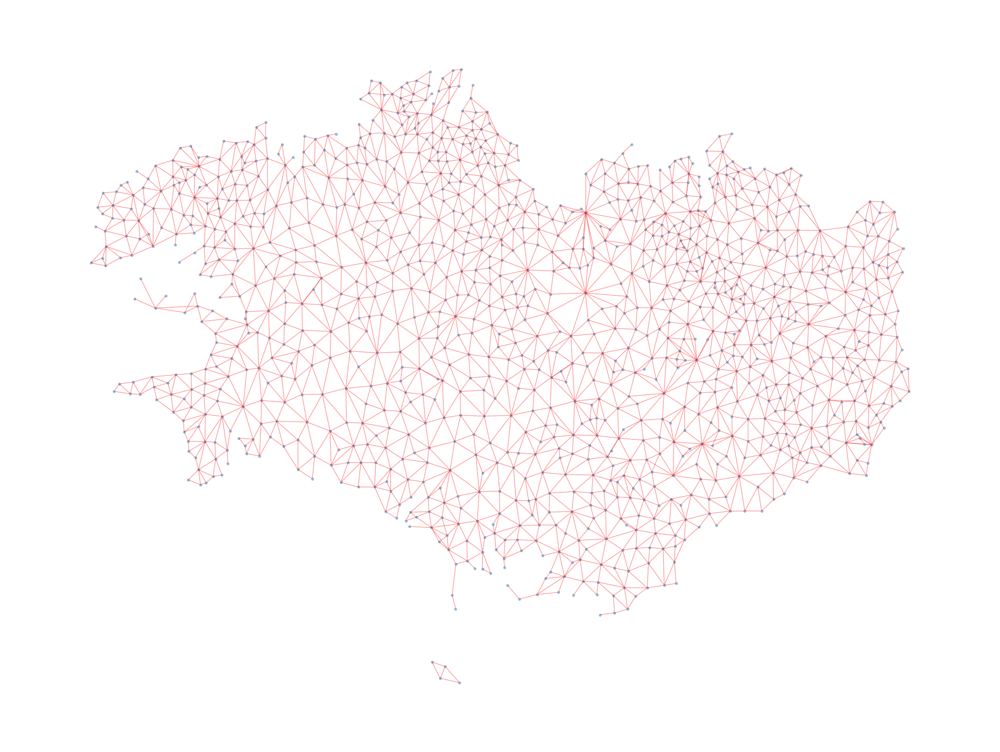

In [16]:
G.remove_edges_from(list(nx.selfloop_edges(G)))
nx.draw(G,pos=pos_insee,node_size=10, alpha=0.4, edge_color="r", font_size=16, with_labels=False)

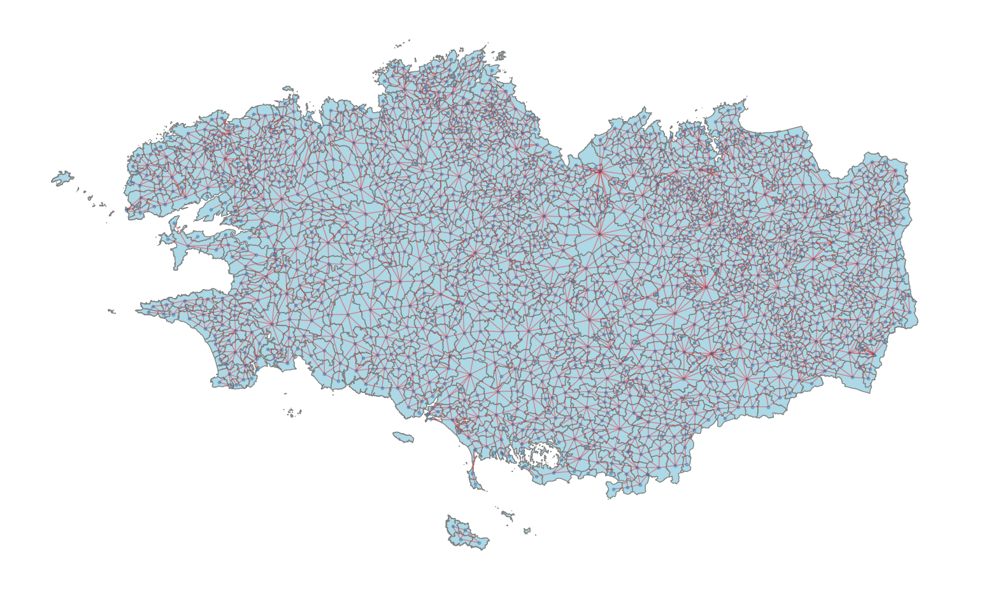

In [17]:
#on peut également utiliser des fonds de carte (via le format geojson par exemple)

import geopandas
region = geopandas.read_file("./DonneesFourniesGraphes/communes-geo.geojson")


plt.close()
# plot with a nice basemap
ax = region.plot(linewidth=1, edgecolor="grey", facecolor="lightblue")
ax.axis("off")
nx.draw(G, pos=pos_insee, ax=ax,node_size=10, alpha=0.4, edge_color="r")
plt.show()

Dans cette partie nous voulons effectué un graphes des communes bretonnes en fonctions des dègres et calculer l'excentricité.

Donc pour savoir le degres de chaque commune nous allons tout d'abord recuperer les voisins bretons des communes, puis nous allons compter le nombre de voisins de chaque commune. Après nous allons trier les degres par ordre croissant. Puis on va pouvoir varier la taille des communes en fonction du nombre de voisin.

In [18]:
# Création d'un dictionnaire où la clé est l'INSEE de la commune et la valeur est le résultat de la fonction amezek(x)
voisinsCommunes = {communes['insee'][x]: amezek(x) for x in range(len(communes['insee']))}

# Création d'un dictionnaire qui va stocker le nombre de voisins de chaque commune
nbVoisinsCommune = {}

# Boucle pour calculer et afficher le nombre de voisins de chaque commune
for key, value in voisinsCommunes.items():
    # Calcul du nombre de voisins en comptant les éléments non vides dans value
    nb_voisins = len([item for item in value if item])
    
    # Stockage du nombre de voisins dans le dictionnaire nbVoisinsCommune
    nbVoisinsCommune[key] = nb_voisins
    
    # Affichage du résultat pour chaque commune
    print(f"Degres pour {key} : {nb_voisins}")


Degres pour 22001 : 5
Degres pour 22002 : 5
Degres pour 22003 : 4
Degres pour 22004 : 7
Degres pour 22005 : 5
Degres pour 22006 : 4
Degres pour 22055 : 3
Degres pour 22008 : 5
Degres pour 22009 : 7
Degres pour 22011 : 8
Degres pour 22012 : 5
Degres pour 22013 : 9
Degres pour 22014 : 7
Degres pour 22015 : 8
Degres pour 22018 : 6
Degres pour 22019 : 7
Degres pour 22020 : 6
Degres pour 22021 : 7
Degres pour 22023 : 5
Degres pour 22024 : 5
Degres pour 22025 : 7
Degres pour 22026 : 7
Degres pour 22027 : 5
Degres pour 22028 : 7
Degres pour 22029 : 8
Degres pour 22030 : 5
Degres pour 22031 : 11
Degres pour 22032 : 8
Degres pour 22033 : 7
Degres pour 22034 : 7
Degres pour 22035 : 5
Degres pour 22036 : 5
Degres pour 22037 : 5
Degres pour 22206 : 6
Degres pour 22039 : 5
Degres pour 22040 : 5
Degres pour 22041 : 4
Degres pour 22042 : 6
Degres pour 22043 : 6
Degres pour 22044 : 7
Degres pour 22045 : 5
Degres pour 22046 : 2
Degres pour 22047 : 5
Degres pour 22048 : 11
Degres pour 22049 : 8
Degres p

In [19]:
import networkx as nx

def calculer_excentricite(graphe):
    # Dictionnaire pour stocker les excentricités de chaque sommet
    excentricites = {}
    
    # Itérer sur chaque sommet du graphe
    for sommet in graphe.nodes():
        # Initialiser une variable pour suivre la distance maximale
        distance_maximale = 0
        try:
            # Utiliser l'algorithme de Dijkstra pour trouver les chemins les plus courts depuis le sommet actuel
            chemins_plus_courts = nx.single_source_dijkstra_path_length(graphe, sommet)
            
            # Itérer sur les distances trouvées pour déterminer la distance maximale
            for sommet_cible, distance in chemins_plus_courts.items():
                if distance > distance_maximale:
                    distance_maximale = distance
            
            # Assigner la distance maximale comme excentricité du sommet actuel
            excentricites[sommet] = distance_maximale
        except nx.NetworkXNoPath:
            # Gérer le cas où il n'y a pas de chemin entre le sommet actuel et un autre sommet
            excentricites[sommet] = None
    
    return excentricites

# Calculer les excentricités des sommets du graphe
excentricites = calculer_excentricite(G)

# Afficher les excentricités des sommets
for sommet, excentricite in excentricites.items():
    if excentricite is not None:  # Vérifier qu'il y a un chemin entre le sommet et les autres sommets
        print(f"Excentricité de {sommet} : {excentricite}")


Excentricité de 22001 : 25
Excentricité de 22002 : 29
Excentricité de 22003 : 32
Excentricité de 22004 : 29
Excentricité de 22005 : 29
Excentricité de 22006 : 31
Excentricité de 22055 : 27
Excentricité de 22008 : 33
Excentricité de 22009 : 24
Excentricité de 22011 : 24
Excentricité de 22012 : 30
Excentricité de 22013 : 26
Excentricité de 22014 : 30
Excentricité de 22015 : 27
Excentricité de 22018 : 30
Excentricité de 22019 : 25
Excentricité de 22020 : 30
Excentricité de 22021 : 32
Excentricité de 22023 : 28
Excentricité de 22024 : 30
Excentricité de 22025 : 29
Excentricité de 22026 : 34
Excentricité de 22027 : 27
Excentricité de 22028 : 33
Excentricité de 22029 : 24
Excentricité de 22030 : 31
Excentricité de 22031 : 29
Excentricité de 22032 : 31
Excentricité de 22033 : 23
Excentricité de 22034 : 30
Excentricité de 22035 : 34
Excentricité de 22036 : 32
Excentricité de 22037 : 29
Excentricité de 22206 : 25
Excentricité de 22039 : 27
Excentricité de 22040 : 27
Excentricité de 22041 : 30
E

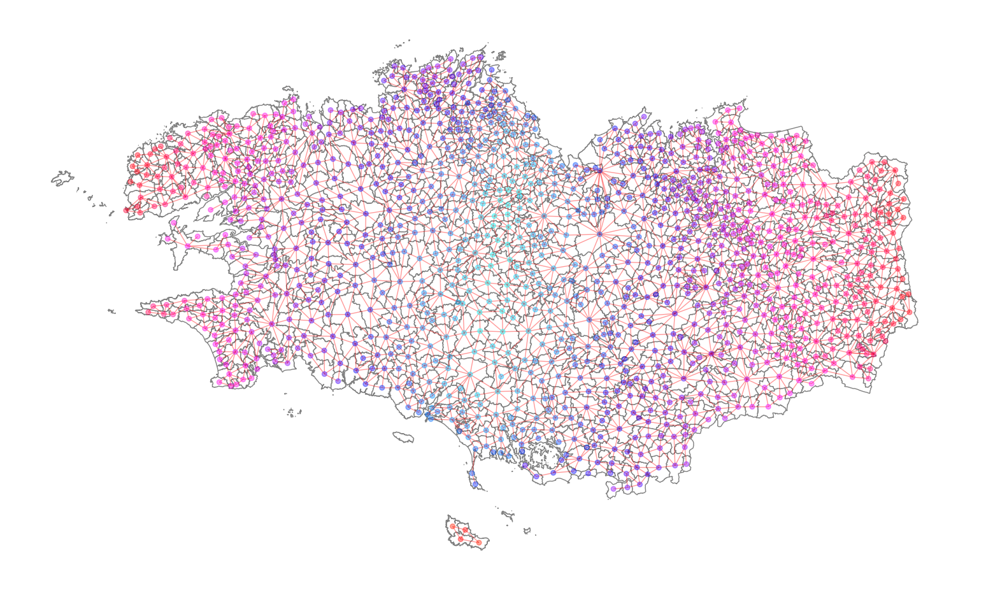

In [20]:
# Plot de l'exentricité
plt.close()
# plot with a nice basemap
ax = region.plot(linewidth=1, edgecolor="grey", facecolor="white")
ax.axis("off")
cmap = plt.get_cmap('hsv')  # Choix de la colormap
nx.draw(G, cmap=cmap, pos=pos_insee, ax=ax,node_size=30, alpha=0.4, edge_color="r", node_color=tuple(excentricites.values()))

plt.show()

plt.close()

## Les exemples

### 1er exemple

Pour cette exemple nous voudrons trouvé le chemin le plus courts entre une ville avec une excentricité importante et une commune qu'on va choisir et faire un graphes du chemin obtenu.

Pour cet exemple nous voulons trouvé le chemin le plus court entre une ville defini, et les villes avec une excentricité importante, pour ensuite afficher un graphes du chemin parcouru.

Chemin le plus court de 56054 à 22093 : [56054, 56119, 56023, 56177, 56010, 56074, 56144, 56047, 56024, 22039, 22183, 22046, 22165, 22093]


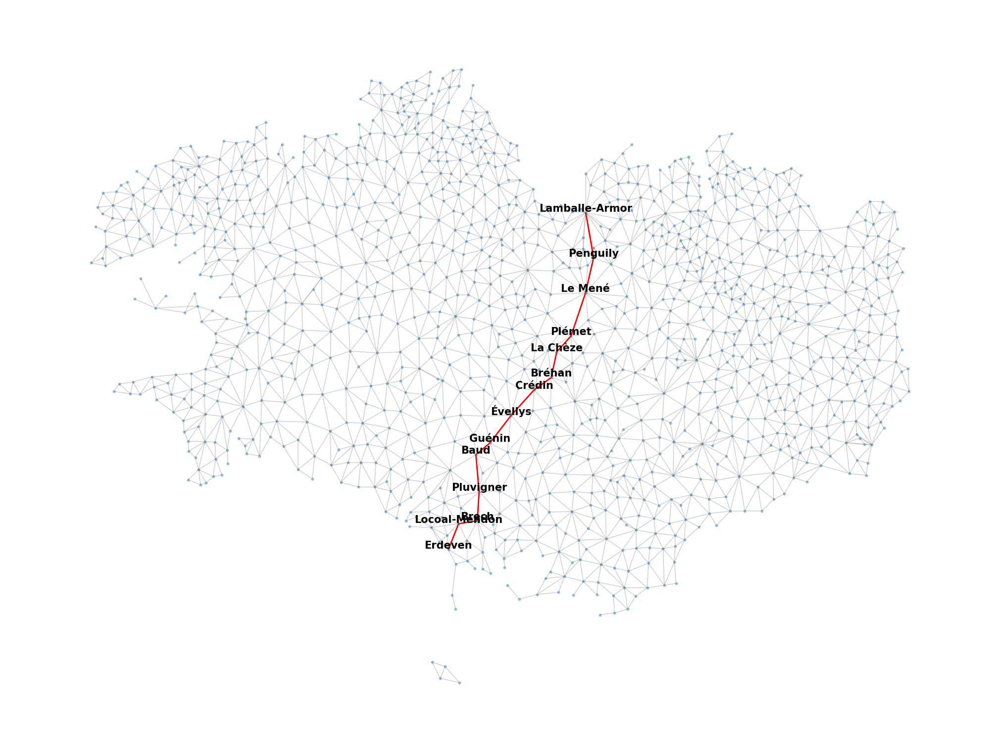

Chemin le plus court de 56054 à 22046 : [56054, 56119, 56023, 56177, 56010, 56074, 56144, 56047, 56024, 22039, 22183, 22046]


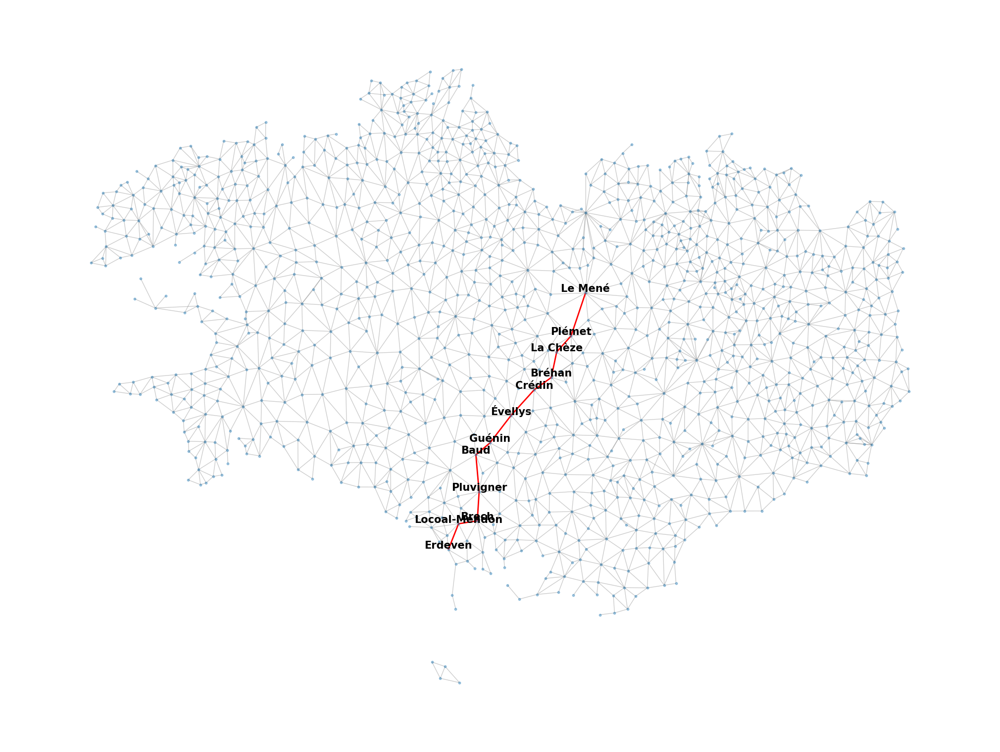

Chemin le plus court de 56054 à 35168 : [56054, 56119, 56023, 56175, 56067, 56042, 56222, 56172, 56112, 56197, 56035, 56191, 56033, 35168]


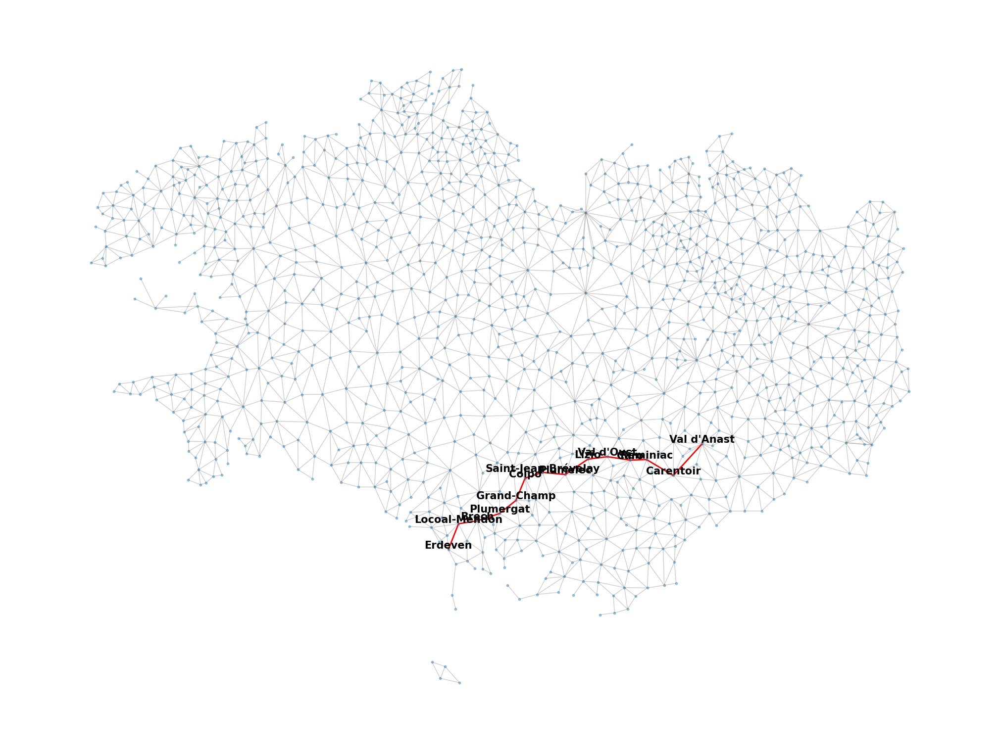

Chemin le plus court de 56054 à 35133 : [56054, 56119, 56023, 56177, 56022, 56141, 56017, 56027, 56070, 56079, 56165, 56032, 35211, 35133]


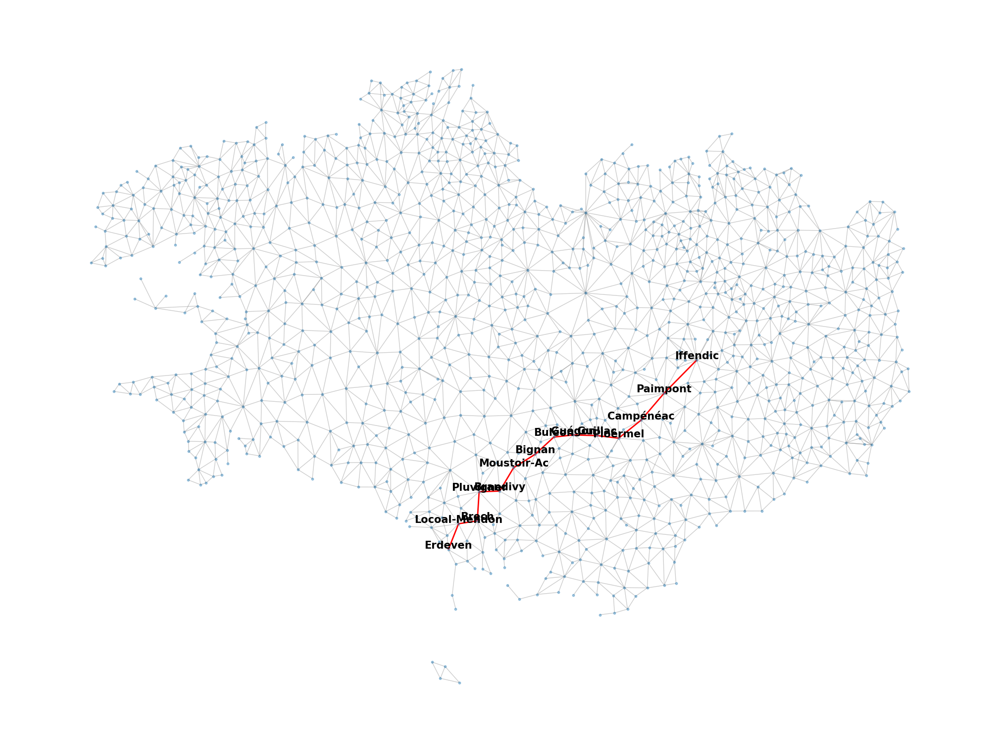

Chemin le plus court de 56054 à 22203 : [56054, 56119, 56023, 56177, 56010, 56074, 56144, 56047, 56024, 22039, 22183, 22155, 22060, 22203]


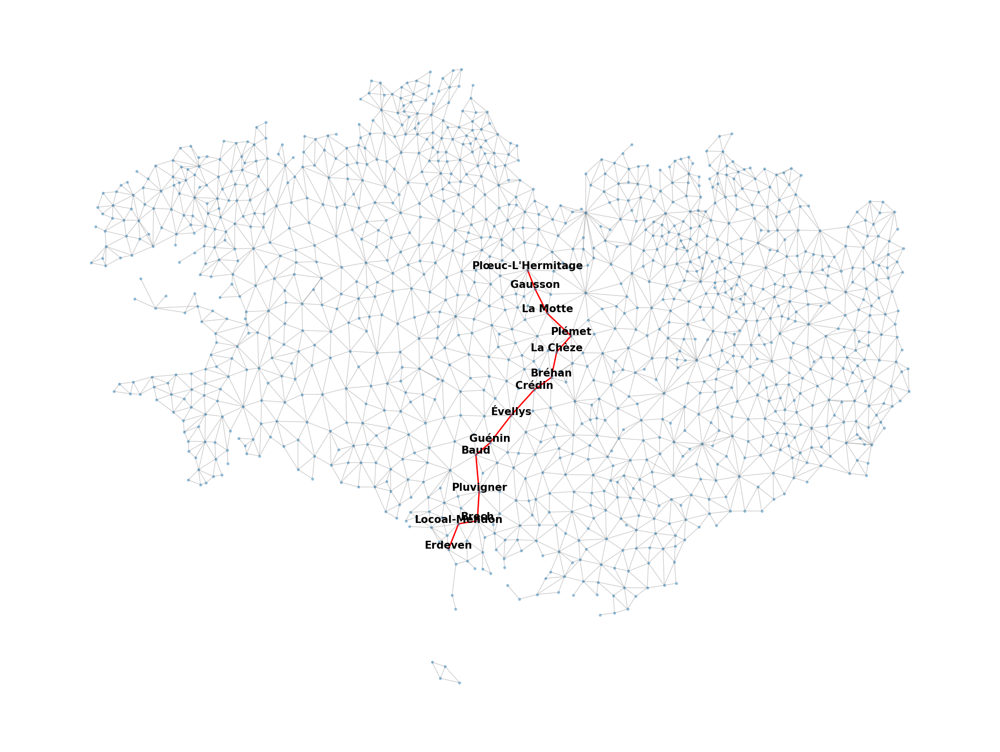

Chemin le plus court de 56054 à 22048 : [56054, 56119, 56023, 56177, 56010, 56074, 56144, 56047, 56024, 22039, 22183, 22046, 22185, 22084, 22014, 22048]


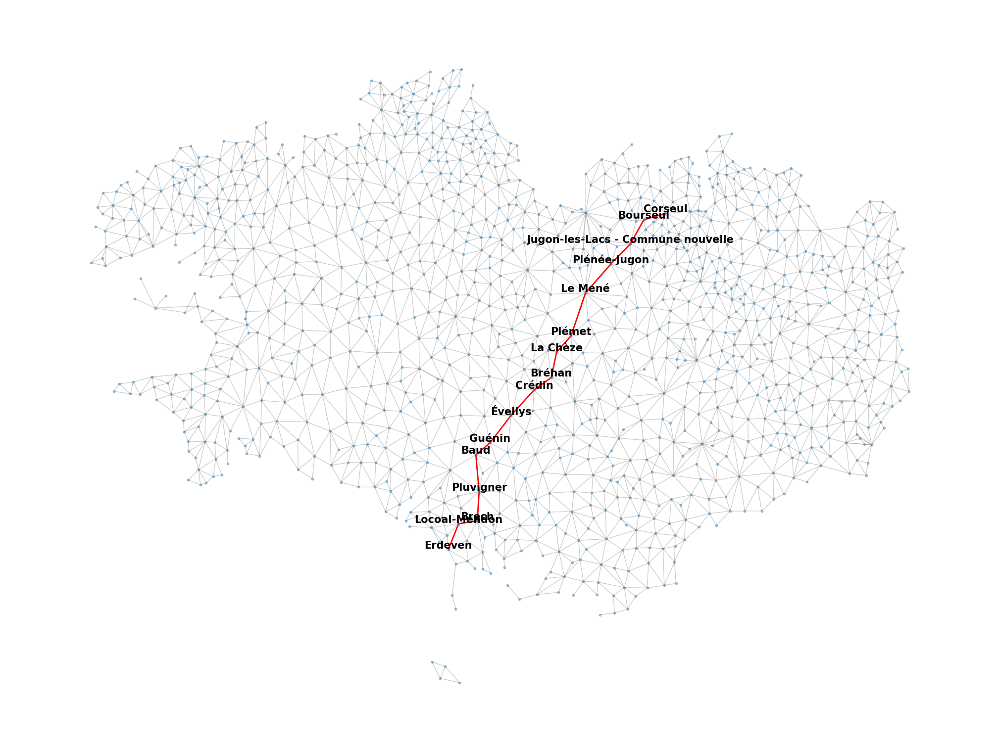

Chemin le plus court de 56054 à 22107 : [56054, 56119, 56148, 56101, 56188, 56026, 56076, 56242, 56245, 22107]


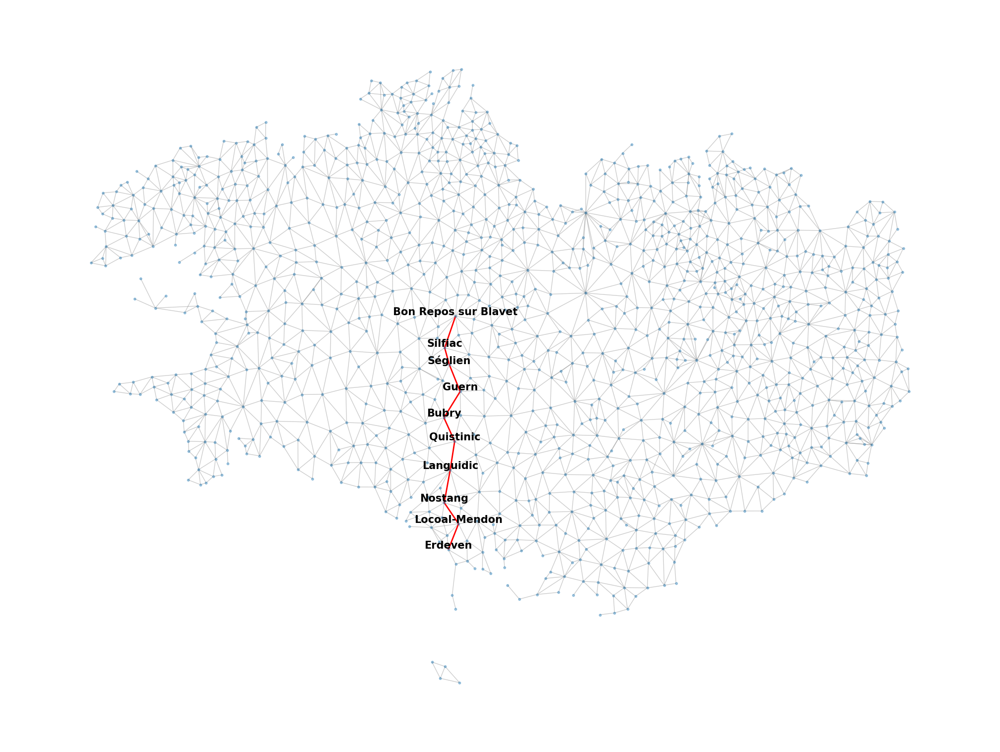

Chemin le plus court de 56054 à 22208 : [56054, 56119, 56023, 56177, 56022, 56141, 56017, 56027, 56070, 56079, 56165, 56032, 35211, 35133, 35184, 35171, 22208]


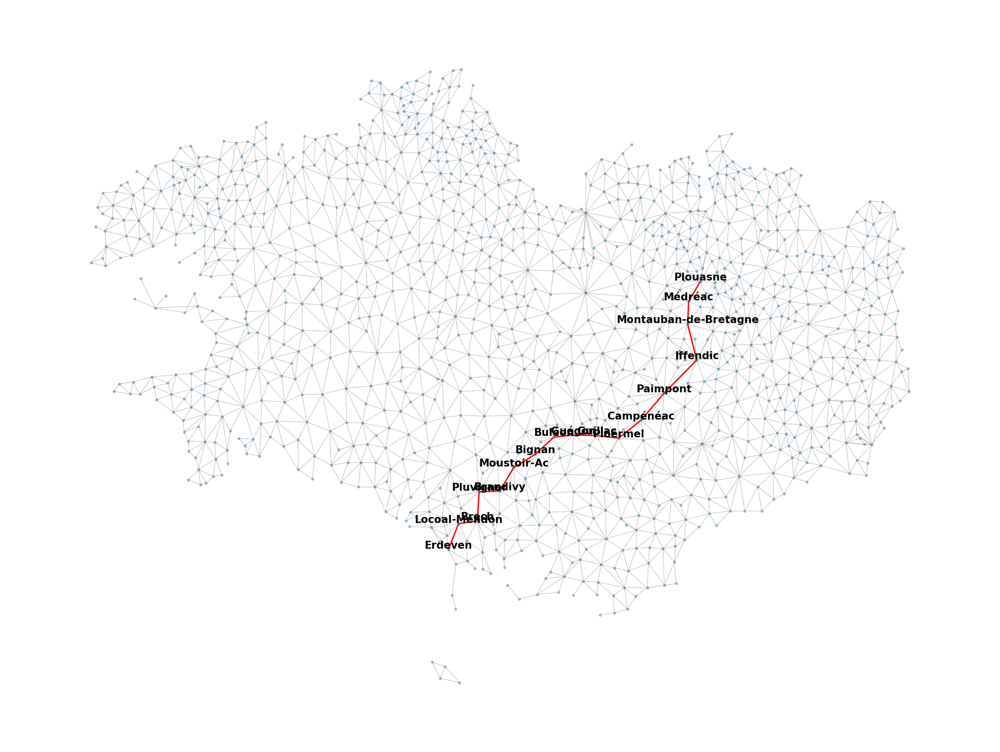

In [24]:
def excentricitNetworkX(G, nbCommune):
    graphesNetworkXExcentricite = nx.degree_centrality(G)
    # On va récupérer les communes triées de plus au moins excentriques en ne conservant que nbCommune communes
    ExcentriciteDeNbCommune = sorted(graphesNetworkXExcentricite, key=graphesNetworkXExcentricite.get, reverse=True)[:nbCommune]
    return ExcentriciteDeNbCommune

def cheminPlusCourt(G, commune_X, commune_Y):
    try:
        cheminCourt = nx.shortest_path(G, source=commune_X, target=commune_Y)
        distance = nx.shortest_path_length(G, source=commune_X, target=commune_Y)
        return cheminCourt, distance
    except nx.NetworkXNoPath:
        # Si pas de chemin trouvé
        return None, float('inf')

nbCommuneExcentricite = 8
communeAComparer = 56054

top_communes = excentricitNetworkX(G, nbCommuneExcentricite)

for commune_Y in top_communes:
    shortest_path, shortest_distance = cheminPlusCourt(G, communeAComparer, commune_Y)
    if shortest_path:
        print(f"Chemin le plus court de {communeAComparer} à {commune_Y} : {shortest_path}")
        plot_graph(shortest_path)
    else:
        print(f"Aucun chemin trouvé de {communeAComparer} à {commune_Y}")

1. La region bretagne peut utiliser notre travail pour identifier les centres urbains majeurs avec une forte excentricité, pour ensuite ameliorer l'efficacité des reseaux de transport. En optimisant les routes, les voies ferrées, les vols en avion ce qui facilitera grandement le deplacement des personnes et des biens.

2. En facilitant l'accès au differents communes majeurs, la region peut stimuler le developpement economique des communes et celui de la region. Les entreprise eux pourraient beneficier d'une meilleurs connection entre eux pour les marchandises ce qui favoriserai la croissant economique.

3. Avoir en têtes les chemins les plus courts entre differentes communes importantes permettrai a la region de planifier plus efficacement les nouvelles infrastructure, la gestion des differents zone residentielles et commerciales, et la preservation des zones naturelles.

4. Dernierement cela est important pour le secteur touristique en facilitant l'accès aux different lieu touristique pour augmeneter le nombre de visiteur et de touriste, cela renforcerai l'economie locale et de permettre a la region bretagne d'être plus attractive.

In [23]:
def plot_graph(connections):
    red_edges = create_path(connections)

    plt.figure(figsize=(20, 15))

    # Positionnement des nœuds pour un espacement des noms de villes
    pos = {node: (x, y) for node, (x, y) in pos_insee.items()}
    pos_labels = {k: (x, y + 0.01) for k, (x, y) in pos.items()}

    # Créer un sous-ensemble de labels pour n'inclure que les communes dans le chemin ou les communes de départ et d'arrivée
    subset_labels = {com: label_insee[com] for com in G.nodes if com in connections or com == connections[0] or com == connections[-1]}
    
    nx.draw(G, pos=pos, node_size=10, alpha=0.4, edge_color="gray", font_size=10)
    nx.draw_networkx_edges(G, pos=pos, edgelist=red_edges, edge_color='red', width=2)
    nx.draw_networkx_labels(G, pos=pos_labels, labels=subset_labels, font_size=15, font_weight="bold")

    # min_x = min(pos[node][0] for node in connections)
    # max_x = max(pos[node][0] for node in connections)
    # min_y = min(pos[node][1] for node in connections)
    # max_y = max(pos[node][1] for node in connections)

    # Ajouter une marge autour des limites des axes
    # margin = 0.1
    # plt.xlim(min_x - margin, max_x + margin)
    # plt.ylim(min_y - margin, max_y + margin)

    plt.show()

    plt.close()

    return

In [22]:
def create_path(connections):
    edges = []
    for i in range(len(connections) - 1):
        edges.append((connections[i], connections[i + 1]))
    return edges

## Exemple n°2 : Les Noeuds et Arretes importante (Commune et chemin)

#faut prendre les communes les plus importante (la ou il faut placer les gares) (bcp de commune passe par lui) et les arretes les plus importante (la region bretagne doit privilegier un bon fonctionnement de ceux-ci).

In [25]:
def chemin_important(G):
    cheminImportant = nx.edge_betweenness_centrality(G)
    cheminImportantTrie = sorted(cheminImportant, key=cheminImportant.get, reverse=True)
    return cheminImportantTrie

def commune_importante(G):
    communeImportant = nx.betweenness_centrality(G)
    communeImportantTrie = sorted(communeImportant, key=communeImportant.get, reverse=True)
    return communeImportantTrie

important_edges = chemin_important(G)
print("Arêtes les plus importantes :")
for edge in important_edges[:20]:
    print(edge)

important_commune = commune_importante(G)
print("Communes les plus importantes :")
for commune in important_commune[:10]:
    print(commune)

Arêtes les plus importantes :
(56173, 56144)
(22046, 22185)
(35133, 35211)
(22031, 22128)
(56066, 56100)
(56173, 56076)
(22087, 22128)
(56047, 56144)
(29278, 56066)
(22048, 22339)
(22084, 22185)
(56100, 56170)
(29180, 29277)
(35133, 35331)
(56076, 56113)
(56113, 56163)
(35196, 35331)
(22299, 22339)
(22046, 22184)
(56163, 56170)
Communes les plus importantes :
22046
56144
35211
35133
22203
56100
22031
22107
22087
22185


In [26]:
def plot_graphSansArrete(edges=None):
    connections = data['connections'] if edges is None else None
    red_edges = create_path(connections) if edges is None else edges

    plt.figure(figsize=(20, 15))

    # Positionnement des nœuds pour un espacement des noms de villes
    pos = {node: (x, y) for node, (x, y) in pos_insee.items()}
    pos_labels = {k: (x, y + 0.01) for k, (x, y) in pos.items()}

    # Créer un sous-ensemble de labels pour n'inclure que les communes dans le chemin ou les communes de départ et d'arrivée

    nx.draw(G, pos=pos, node_size=10, alpha=0.4, edge_color="gray", font_size=10)
    nx.draw_networkx_edges(G, pos=pos, edgelist=red_edges, edge_color='red', width=2)

    plt.show()

    plt.close()

    return

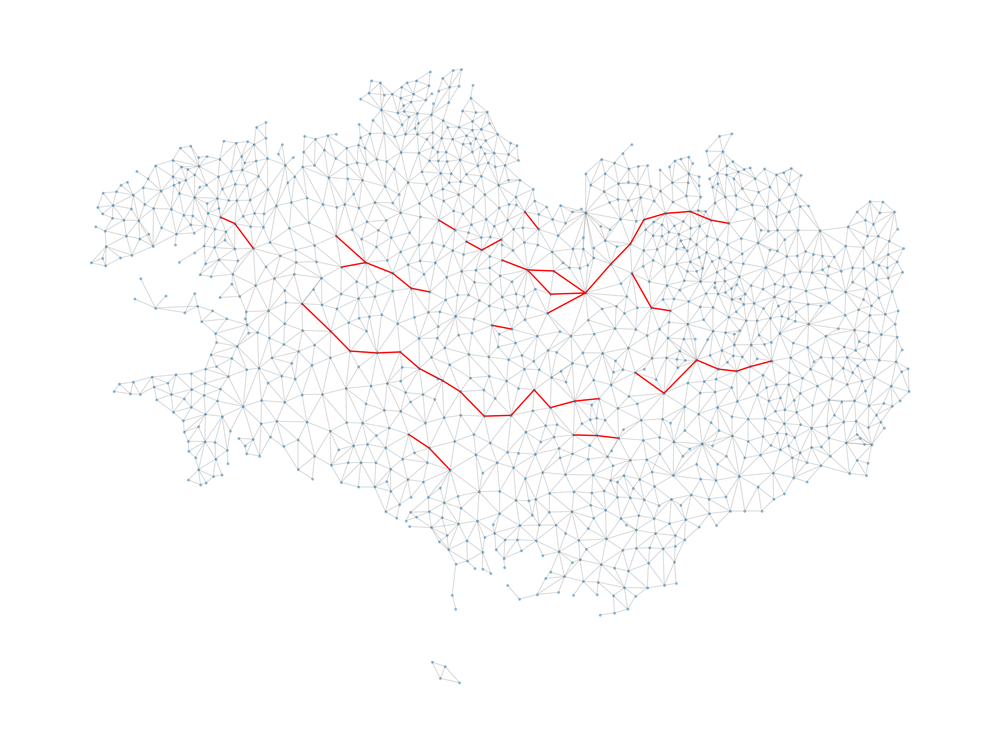

In [27]:
plot_graphSansArrete(important_edges[:50])

En ayant les chemins (routes) important, la région bretagne doit pouvoir construire des routes et des chemin de fer de façon plus stratégique. Et de prévoir les mouvements de masse durant les vacances scolaires en gardant ces routes en fonctionnement sinon il risquerai d'avoir des bouchons ou des problèmes important.

In [28]:
def plot_communes(commune_list):
    plt.figure(figsize=(20, 15))

    # Dessiner tous les nœuds avec leurs positions
    pos = pos_insee
    nx.draw(G, pos=pos, node_size=50, alpha=0.4, node_color='lightblue', edge_color="gray", font_size=10)

    # Identifier les communes importantes dans commune_list
    important_communes = set(commune_list)  # Convertir en ensemble pour une recherche rapide

    # Créer un sous-ensemble de labels pour n'inclure que les communes importantes
    subset_labels = {com: label_insee[com] for com in important_communes}

    # Dessiner les communes importantes en rouge avec leurs étiquettes
    nx.draw_networkx_nodes(G, pos=pos, nodelist=important_communes, node_color='red', node_size=50)
    nx.draw_networkx_labels(G, pos=pos, labels=subset_labels, font_size=15, font_weight="bold")

    plt.title("Carte des communes importantes avec étiquettes")
    plt.show()

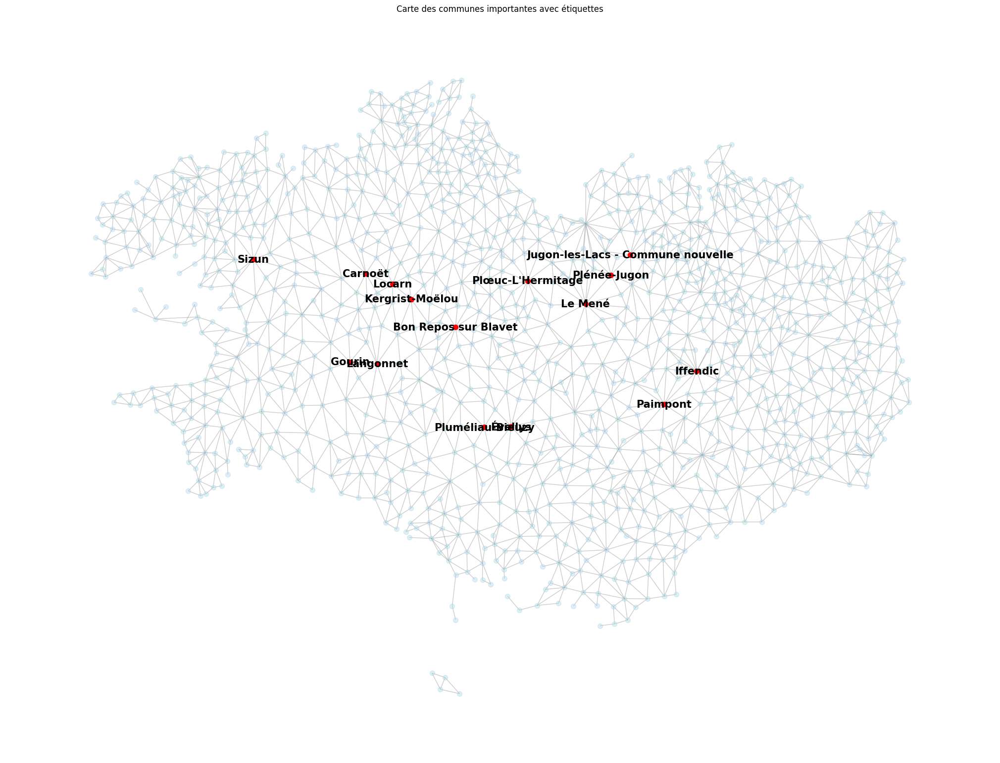

In [29]:
plot_communes(important_commune[:15])

Avoir les communes importantes de la région bretagne permet à la region de placer les axes de transport (Aeroport, Gare) plus judicieusement cela va permettre à la Region Bretagne d'avoir des hubs de transport important, cela facilite les échanges nationaux et internationaux. En plaçant les hubs, la région bretagne pourrait avoir une croissance de tourisme et de flux vers la région bretagne.